# Generate Soft Sketch

In [11]:
import os
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from sklearn.cluster import KMeans, MiniBatchKMeans
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
def generate_sketch_lineart(input_path, contrast_factor=1.1):
    original = mpimg.imread(input_path)
    gray_image = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    inverted_image = 255 - gray_image
    inverted_blurred = cv2.GaussianBlur(inverted_image, (21, 21), 0)
    sketch = cv2.divide(gray_image, 255 - inverted_blurred, scale=255)
    return original, sketch

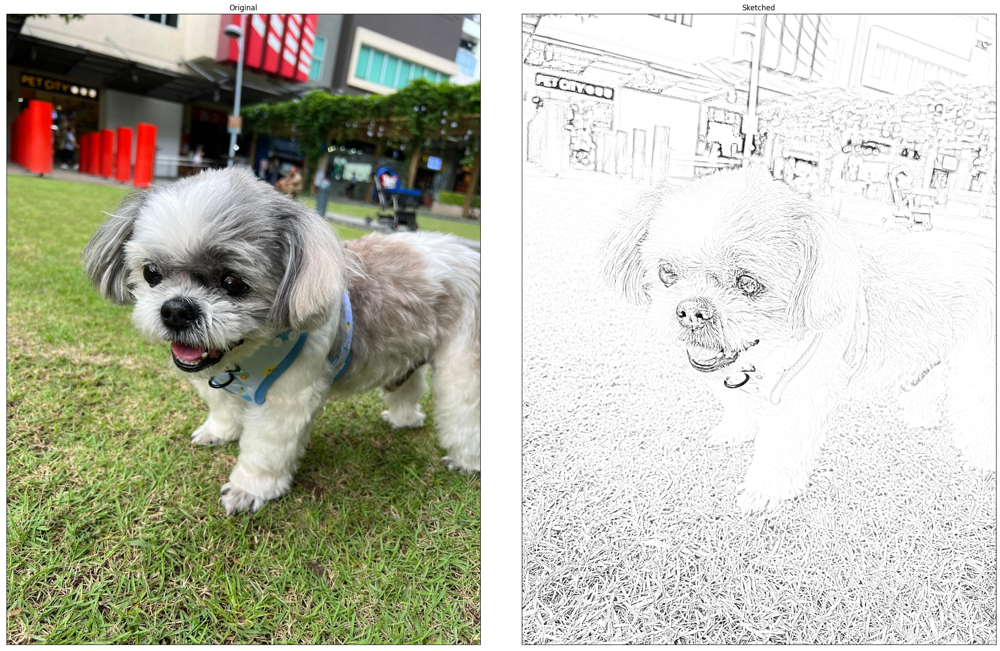

In [5]:
input_path = 'images/input/shihtzu.jpeg'
original, sketch = generate_sketch_lineart(input_path)

fig, axs = plt.subplots(1, 2, figsize=(24, 15))

axs[0].imshow(original)
axs[0].set_title('Original')
axs[1].imshow(sketch, cmap='gray')
axs[1].set_title('Sketched')

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

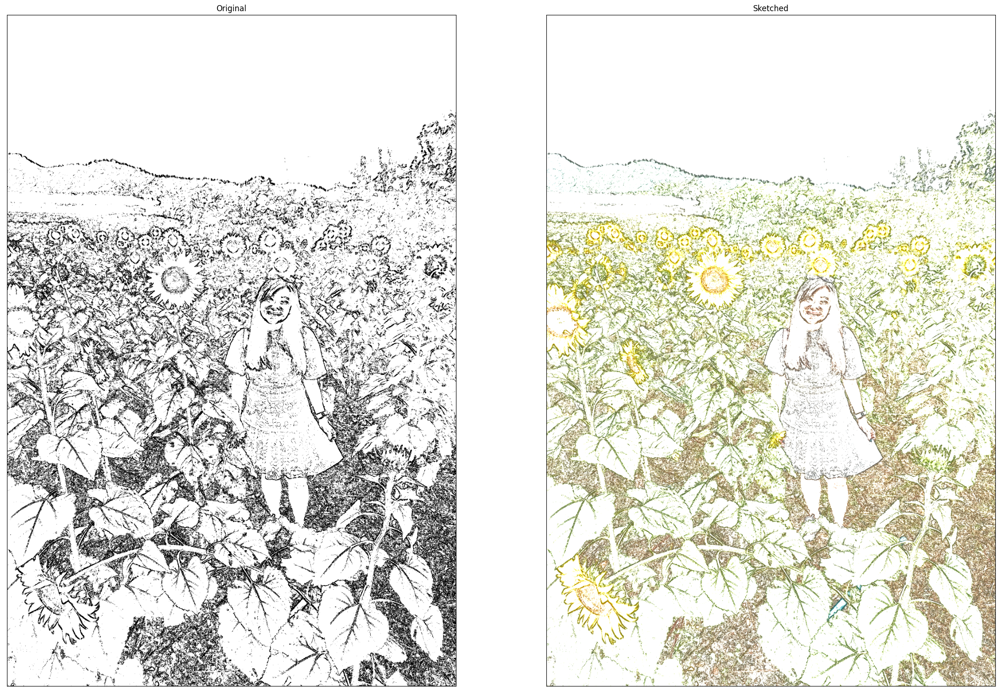

In [7]:
image = cv2.imread('images/input/me_with_sunflowers.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)    
dst_gray, dst_color = cv2.pencilSketch(image, sigma_s=90, sigma_r=0.05, shade_factor=0.2) 


fig, axs = plt.subplots(1, 2, figsize=(24, 15))

axs[0].imshow(dst_gray, cmap='gray')
axs[0].set_title('Original')
axs[1].imshow(dst_color)
axs[1].set_title('Sketched')

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

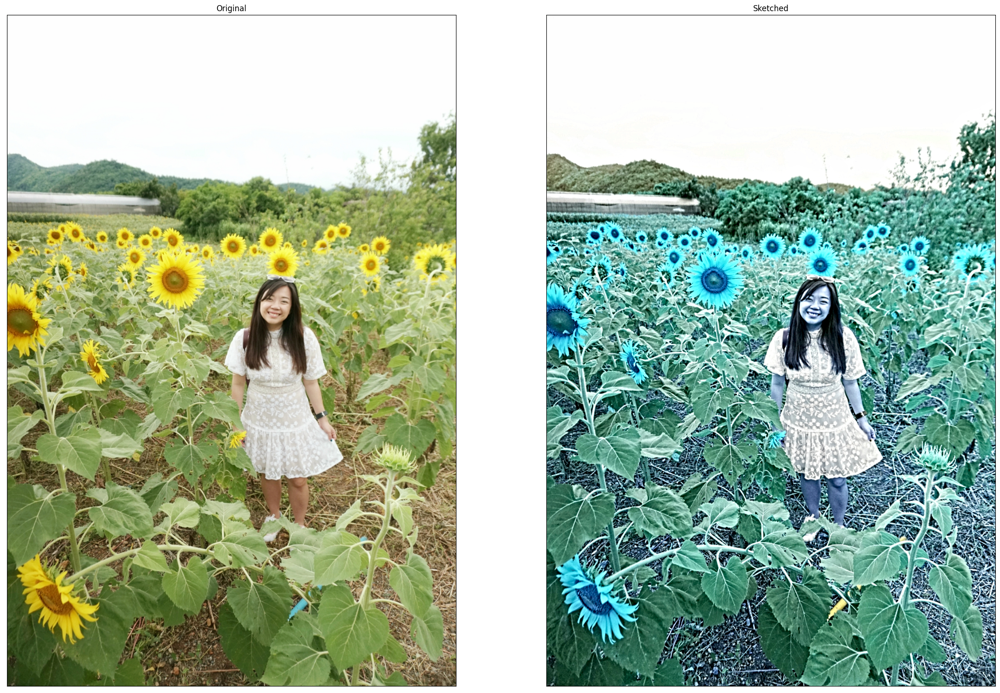

In [10]:
image = cv2.imread('images/input/me_with_sunflowers.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)    

detailed = cv2.detailEnhance(image, sigma_s=10, sigma_r=0.15)
detailed = cv2.cvtColor(detailed, cv2.COLOR_BGR2RGB)

cv2.imwrite('images/input/me_with_sunflowers_detailed.jpg', detailed)

fig, axs = plt.subplots(1, 2, figsize=(24, 15))

axs[0].imshow(image)
axs[0].set_title('Original')
axs[1].imshow(detailed)
axs[1].set_title('Sketched')

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()